## LENDING CLUB Exploratory Data Analysis

#### Team Member: Pavani Gangula 
#### Email: pavaniraogangula@gmail.com

#### Group Facilitator: Naveen Kumar
#### Email: navinrajput736@gmail.com

### 1. Data Understanding

In [1]:
# Import necessary libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Read the input file
data = pd.read_csv(r'loan.csv')

In [3]:
# Check the number of rows and columns in the data
data.shape

(39717, 111)

In [4]:
# Check the column names in the data
data.columns

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade',
       ...
       'num_tl_90g_dpd_24m', 'num_tl_op_past_12m', 'pct_tl_nvr_dlq',
       'percent_bc_gt_75', 'pub_rec_bankruptcies', 'tax_liens',
       'tot_hi_cred_lim', 'total_bal_ex_mort', 'total_bc_limit',
       'total_il_high_credit_limit'],
      dtype='object', length=111)

### 2. Data Cleaning

In [5]:
# Check the number of missing values in all columns
data.isna().sum()

id                                0
member_id                         0
loan_amnt                         0
funded_amnt                       0
funded_amnt_inv                   0
                              ...  
tax_liens                        39
tot_hi_cred_lim               39717
total_bal_ex_mort             39717
total_bc_limit                39717
total_il_high_credit_limit    39717
Length: 111, dtype: int64

In [6]:
# Dropping the columns with all null values 
data.dropna(axis = 1, how = 'all', inplace = True)

In [7]:
data.shape

(39717, 57)

#### We are left with 57 columns after removing the columns with missing values

In [8]:
# Checking percentage of missing data
data.isna().sum()*100/len(data)

id                             0.000000
member_id                      0.000000
loan_amnt                      0.000000
funded_amnt                    0.000000
funded_amnt_inv                0.000000
term                           0.000000
int_rate                       0.000000
installment                    0.000000
grade                          0.000000
sub_grade                      0.000000
emp_title                      6.191303
emp_length                     2.706650
home_ownership                 0.000000
annual_inc                     0.000000
verification_status            0.000000
issue_d                        0.000000
loan_status                    0.000000
pymnt_plan                     0.000000
url                            0.000000
desc                          32.580507
purpose                        0.000000
title                          0.027696
zip_code                       0.000000
addr_state                     0.000000
dti                            0.000000


In [9]:
# Removing columns with >30% missing values and which have very less values available and which do not contribute to the analysis
data_clean = data.drop(["id", "member_id", "url", "title", "emp_title", "zip_code",
                "last_credit_pull_d", "addr_state","desc","out_prncp_inv","total_pymnt_inv",
                "funded_amnt", "delinq_2yrs", "revol_bal", "out_prncp", "total_pymnt",
                "total_rec_prncp", "total_rec_int", "total_rec_late_fee", "recoveries",
                "collection_recovery_fee", "last_pymnt_d", "last_pymnt_amnt", "next_pymnt_d" ,
                "chargeoff_within_12_mths", "mths_since_last_delinq", "mths_since_last_record",'pymnt_plan',
                        "initial_list_status",'collections_12_mths_ex_med','policy_code','acc_now_delinq',
                        'application_type', 'pub_rec_bankruptcies', 'tax_liens', 'delinq_amnt'], axis = 1)

In [10]:
data_clean.shape

(39717, 21)

#### We are left with 21 columns after removing all unnecessary columns

In [11]:
# Checking missing values in remaining columns
data_clean.isna().sum()

loan_amnt                 0
funded_amnt_inv           0
term                      0
int_rate                  0
installment               0
grade                     0
sub_grade                 0
emp_length             1075
home_ownership            0
annual_inc                0
verification_status       0
issue_d                   0
loan_status               0
purpose                   0
dti                       0
earliest_cr_line          0
inq_last_6mths            0
open_acc                  0
pub_rec                   0
revol_util               50
total_acc                 0
dtype: int64

#### It is observed that "emp_length" and "revol_util" have missing values in them

In [12]:
# Checking the distribution of "revol_util"
data_clean['revol_util'].value_counts()

0%        977
0.20%      63
63%        62
40.70%     58
66.70%     58
         ... 
25.74%      1
47.36%      1
24.65%      1
10.61%      1
7.28%       1
Name: revol_util, Length: 1089, dtype: int64

In [13]:
# Checking the distribution of "emp_length"
data_clean['emp_length'].value_counts()

10+ years    8879
< 1 year     4583
2 years      4388
3 years      4095
4 years      3436
5 years      3282
1 year       3240
6 years      2229
7 years      1773
8 years      1479
9 years      1258
Name: emp_length, dtype: int64

#### It is observed that most of the loan applicants have an employement length of >10 years. So we impute the missing values with >10 years (i.e mode). Similarly for "revol_util", we replace the missing values with 0% (i.e mode)

In [14]:
data_clean['emp_length'].fillna(data_clean['emp_length'].mode()[0], inplace = True)
data_clean['revol_util'].fillna(data_clean['revol_util'].mode()[0], inplace = True)

In [15]:
data_clean.shape

(39717, 21)

In [16]:
data_clean.isna().sum()

loan_amnt              0
funded_amnt_inv        0
term                   0
int_rate               0
installment            0
grade                  0
sub_grade              0
emp_length             0
home_ownership         0
annual_inc             0
verification_status    0
issue_d                0
loan_status            0
purpose                0
dti                    0
earliest_cr_line       0
inq_last_6mths         0
open_acc               0
pub_rec                0
revol_util             0
total_acc              0
dtype: int64

#### Now, we have zero missing values in the data.

In [17]:
# Removing "%" symbol so that we can use the values for analysis
data_clean['int_rate'] = data_clean['int_rate'].str.rstrip('%')
data_clean['revol_util'] = data_clean['revol_util'].str.rstrip('%')

In [18]:
data_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 21 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   loan_amnt            39717 non-null  int64  
 1   funded_amnt_inv      39717 non-null  float64
 2   term                 39717 non-null  object 
 3   int_rate             39717 non-null  object 
 4   installment          39717 non-null  float64
 5   grade                39717 non-null  object 
 6   sub_grade            39717 non-null  object 
 7   emp_length           39717 non-null  object 
 8   home_ownership       39717 non-null  object 
 9   annual_inc           39717 non-null  float64
 10  verification_status  39717 non-null  object 
 11  issue_d              39717 non-null  object 
 12  loan_status          39717 non-null  object 
 13  purpose              39717 non-null  object 
 14  dti                  39717 non-null  float64
 15  earliest_cr_line     39717 non-null 

In [55]:
# Converting the data type to create categories
data_clean['int_rate'] = data_clean['int_rate'].astype('float64')
data_clean['open_acc'] = data_clean['open_acc'].astype('float64')
data_clean['revol_util'] = data_clean['revol_util'].astype('float64')
data_clean['total_acc'] = data_clean['total_acc'].astype('float64')
data_clean['annual_inc'] = data_clean['annual_inc'].astype('float64')

In [56]:
#Creating bins for int_rate,open_acc,revol_util,total_acc for ease of working with the data
data_clean['int_rate_groups'] = pd.cut(data_clean['int_rate'], bins=5,precision =0,labels=['5%-9%','9%-13%','13%-17%','17%-21%','21%-24%'])
data_clean['open_acc_groups'] = pd.cut(data_clean['open_acc'],bins = 5,precision =0,labels=['2-10','10-19','19-27','27-36','36-44'])
data_clean['revol_util_groups'] = pd.cut(data_clean['revol_util'], bins=5,precision =0,labels=['0-20','20-40','40-60','60-80','80-100'])
data_clean['total_acc_groups'] = pd.cut(data_clean['total_acc'], bins=5,precision =0,labels=['2-20','20-37','37-55','55-74','74-90'])
data_clean['annual_inc_groups'] = pd.cut(data_clean['annual_inc'], bins=5,precision =0,labels =['3k-31k','31k-58k','58k-85k','85k-112k','112k-140k'])

In [21]:
# Checking the distribution of "loan_status"
data_clean['loan_status'].value_counts()

Fully Paid     32950
Charged Off     5627
Current         1140
Name: loan_status, dtype: int64

In [22]:
# Remove the rows with "current" as loan status because they cannot add any value to the analysis

data_clean = data_clean[data_clean['loan_status'] != "Current"]

#### Now the data is ready for further analysis

### 3. Data Analysis

In [23]:
from ydata_profiling import ProfileReport

In [24]:
# Checking the general profile of data using pandas profiling
profile = ProfileReport(data_clean, title="Profiling Report")

In [25]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Univariate Analysis

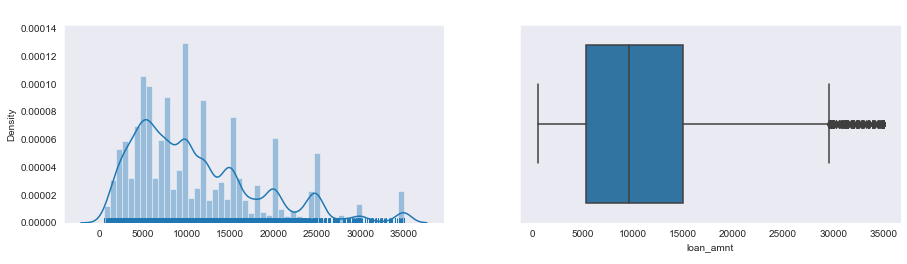

In [26]:
# Loan amount

plt.figure(figsize=(15,8))
sns.set_style("dark")
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.distplot(data_clean['loan_amnt'],rug = True)
ax.set_title('Loan Amount - Distribution Chart',fontsize=16,color='w')
ax.set_xlabel('Loan Amount',fontsize=14,color='w')
# subplot 2
plt.subplot(2, 2, 2)
ax = sns.boxplot(data_clean['loan_amnt'])
ax.set_title('Loan Amount - Box Plot',fontsize=16,color='w')
ax.set_ylabel('Loan Amount',fontsize=14,color='w')
plt.show()

In [27]:
# There are many outliers in "loan_amnt", so removing them
per_95_annual_inc = data_clean['loan_amnt'].quantile(0.95)
data_clean = data_clean[data_clean.loan_amnt <= per_95_annual_inc]

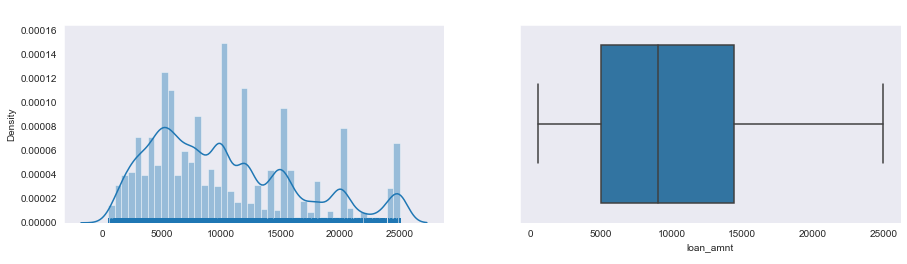

In [28]:
# Loan amount - After removing outliers

plt.figure(figsize=(15,8))
sns.set_style("dark")
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.distplot(data_clean['loan_amnt'],rug = True)
ax.set_title('Loan Amount - Distribution Chart',fontsize=16,color='w')
ax.set_xlabel('Loan Amount',fontsize=14,color='w')
# subplot 2
plt.subplot(2, 2, 2)
ax = sns.boxplot(data_clean['loan_amnt'])
ax.set_title('Loan Amount - Box Plot',fontsize=16,color='w')
ax.set_ylabel('Loan Amount',fontsize=14,color='w')
plt.show()

#### It is observed that the loan amount ranges between 0 - 25000 after removing outliers

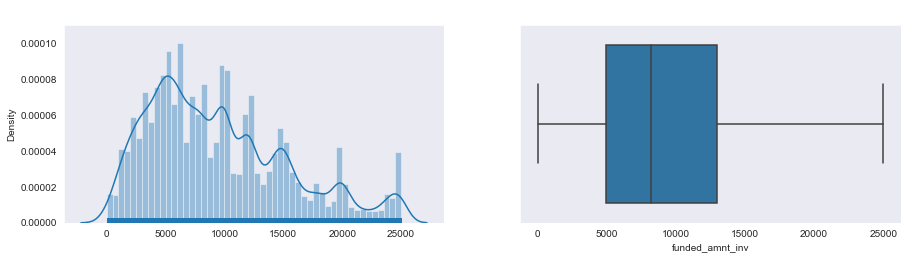

In [29]:
# "funded_amnt_inv"

plt.figure(figsize=(15,8))
sns.set_style("dark")
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.distplot(data_clean['funded_amnt_inv'],rug = True)
ax.set_title('Funded Amount - Distribution Chart',fontsize=16,color='w')
ax.set_xlabel('Funded Amount',fontsize=14,color='w')
# subplot 2
plt.subplot(2, 2, 2)
ax = sns.boxplot(data_clean['funded_amnt_inv'])
ax.set_title('Funded Amount - Box Plot',fontsize=16,color='w')
ax.set_ylabel('Funded Amount',fontsize=14,color='w')
plt.show()

In [30]:
# There are many outliers in "funded_amnt_inv", so removing them
per_95_annual_inc = data_clean['funded_amnt_inv'].quantile(0.95)
data_clean = data_clean[data_clean.funded_amnt_inv <= per_95_annual_inc]

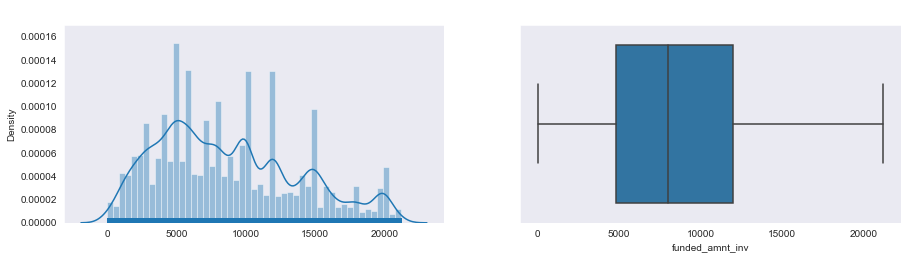

In [31]:
# "funded_amnt_inv" - After removing outliers

plt.figure(figsize=(15,8))
sns.set_style("dark")
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.distplot(data_clean['funded_amnt_inv'],rug = True)
ax.set_title('Funded Amount - Distribution Chart',fontsize=16,color='w')
ax.set_xlabel('Funded Amount',fontsize=14,color='w')
# subplot 2
plt.subplot(2, 2, 2)
ax = sns.boxplot(data_clean['funded_amnt_inv'])
ax.set_title('Funded Amount - Box Plot',fontsize=16,color='w')
ax.set_ylabel('Funded Amount',fontsize=14,color='w')
plt.show()

#### It is observed that the funded amount by investors ranges between 0 - 20000 after removing outliers

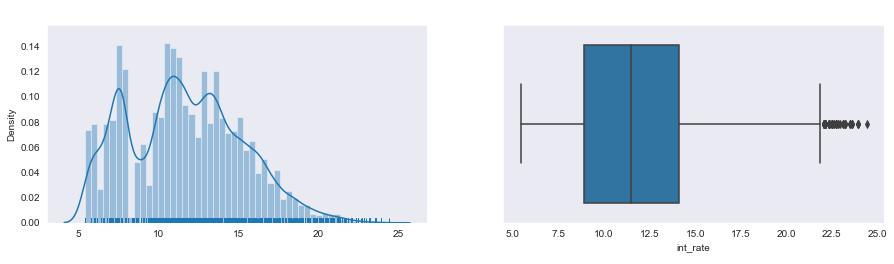

In [32]:
# Interest Rate

plt.figure(figsize=(15,8))
sns.set_style("dark")
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.distplot(data_clean['int_rate'],rug = True)
ax.set_title('Interest Rate - Distribution Chart',fontsize=16,color='w')
ax.set_xlabel('Interest Rate',fontsize=14,color='w')
# subplot 2
plt.subplot(2, 2, 2)
ax = sns.boxplot(data_clean['int_rate'])
ax.set_title('Interest Rate - Box Plot',fontsize=16,color='w')
ax.set_ylabel('Interest Rate',fontsize=14,color='w')
plt.show()

In [33]:
# There are many outliers in "int_rate", so removing them
per_95_annual_inc = data_clean['int_rate'].quantile(0.95)
data_clean = data_clean[data_clean.int_rate <= per_95_annual_inc]

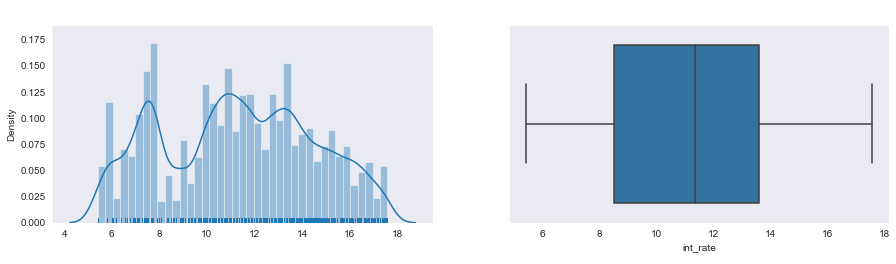

In [34]:
# Interest Rate - After removing outliers

plt.figure(figsize=(15,8))
sns.set_style("dark")
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.distplot(data_clean['int_rate'],rug = True)
ax.set_title('Interest Rate - Distribution Chart',fontsize=16,color='w')
ax.set_xlabel('Interest Rate',fontsize=14,color='w')
# subplot 2
plt.subplot(2, 2, 2)
ax = sns.boxplot(data_clean['int_rate'])
ax.set_title('Interest Rate - Box Plot',fontsize=16,color='w')
ax.set_ylabel('Interest Rate',fontsize=14,color='w')
plt.show()

#### It is observed that the interest rates ranges from 4-18% after removing outliers

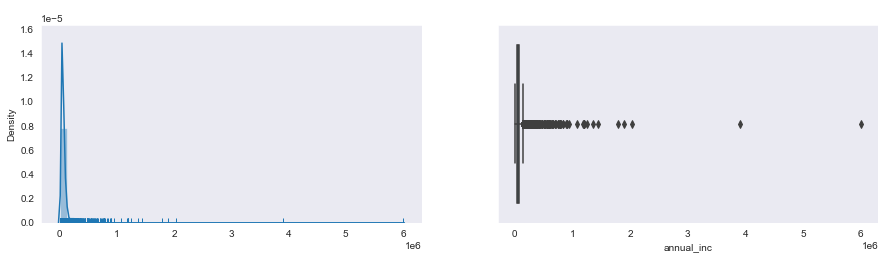

In [35]:
# Annual Income

plt.figure(figsize=(15,8))
sns.set_style("dark")
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.distplot(data_clean['annual_inc'],rug = True)
ax.set_title('Annual Income - Distribution Chart',fontsize=16,color='w')
ax.set_xlabel('Annual Income',fontsize=14,color='w')
# subplot 2
plt.subplot(2, 2, 2)
ax = sns.boxplot(data_clean['annual_inc'])
ax.set_title('Annual Income - Box Plot',fontsize=16,color='w')
ax.set_ylabel('Annual Income',fontsize=14,color='w')
plt.show()

In [36]:
# There are many outliers in "annual_inc", so removing them
per_95_annual_inc = data_clean['annual_inc'].quantile(0.95)
data_clean = data_clean[data_clean.annual_inc <= per_95_annual_inc]

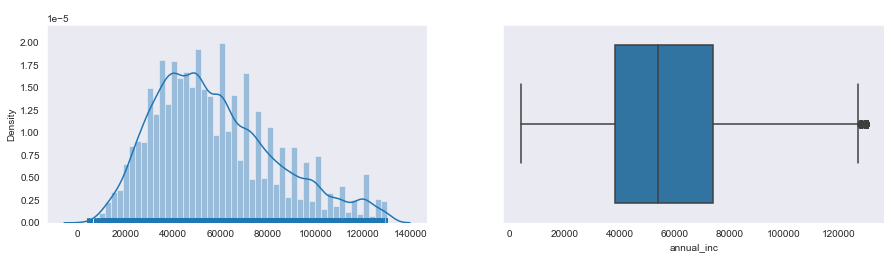

In [37]:
# Annual Income - After removing outliers

plt.figure(figsize=(15,8))
sns.set_style("dark")
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.distplot(data_clean['annual_inc'],rug = True)
ax.set_title('Annual Income - Distribution Chart',fontsize=16,color='w')
ax.set_xlabel('Annual Income',fontsize=14,color='w')
# subplot 2
plt.subplot(2, 2, 2)
ax = sns.boxplot(data_clean['annual_inc'])
ax.set_title('Annual Income - Box Plot',fontsize=16,color='w')
ax.set_ylabel('Annual Income',fontsize=14,color='w')
plt.show()

#### Annual income has many outliers in the data. After removing the values considering 95th percentile, it ranges from 0 to 140000

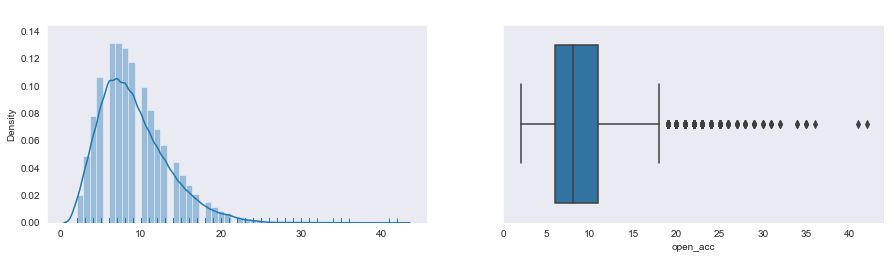

In [38]:
# open_acc

plt.figure(figsize=(15,8))
sns.set_style("dark")
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.distplot(data_clean['open_acc'],rug = True)
ax.set_title('open_acc - Distribution Chart',fontsize=16,color='w')
ax.set_xlabel('open_acc',fontsize=14,color='w')
# subplot 2
plt.subplot(2, 2, 2)
ax = sns.boxplot(data_clean['open_acc'])
ax.set_title('open_acc - Box Plot',fontsize=16,color='w')
ax.set_ylabel('open_acc',fontsize=14,color='w')
plt.show()

In [39]:
# There are many outliers in "open_acc", so removing them
per_95_annual_inc = data_clean['open_acc'].quantile(0.95)
data_clean = data_clean[data_clean.open_acc <= per_95_annual_inc]

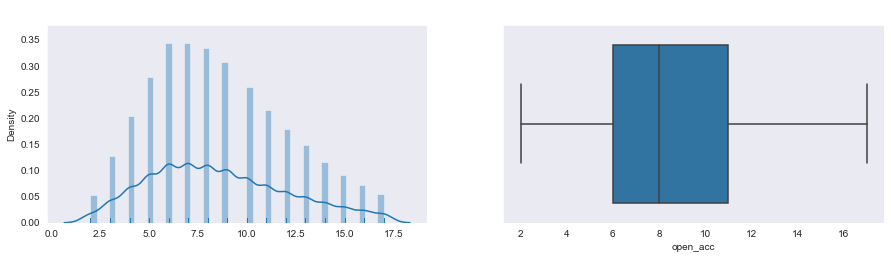

In [40]:
# open_acc - After removing outliers

plt.figure(figsize=(15,8))
sns.set_style("dark")
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.distplot(data_clean['open_acc'],rug = True)
ax.set_title('open_acc - Distribution Chart',fontsize=16,color='w')
ax.set_xlabel('open_acc',fontsize=14,color='w')
# subplot 2
plt.subplot(2, 2, 2)
ax = sns.boxplot(data_clean['open_acc'])
ax.set_title('open_acc - Box Plot',fontsize=16,color='w')
ax.set_ylabel('open_acc',fontsize=14,color='w')
plt.show()

#### It is observed that the column "open_acc" ranges from 2 to 17.5 after removing outliers

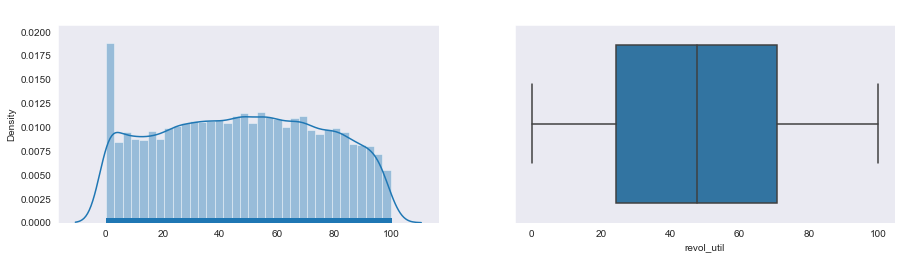

In [41]:
# revol_util

plt.figure(figsize=(15,8))
sns.set_style("dark")
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.distplot(data_clean['revol_util'],rug = True)
ax.set_title('revol_util - Distribution Chart',fontsize=16,color='w')
ax.set_xlabel('revol_util',fontsize=14,color='w')
# subplot 2
plt.subplot(2, 2, 2)
ax = sns.boxplot(data_clean['revol_util'])
ax.set_title('revol_util - Box Plot',fontsize=16,color='w')
ax.set_ylabel('revol_util',fontsize=14,color='w')
plt.show()

#### The column "revol_util" has no outliers so, we can consider the data as is for the analysis

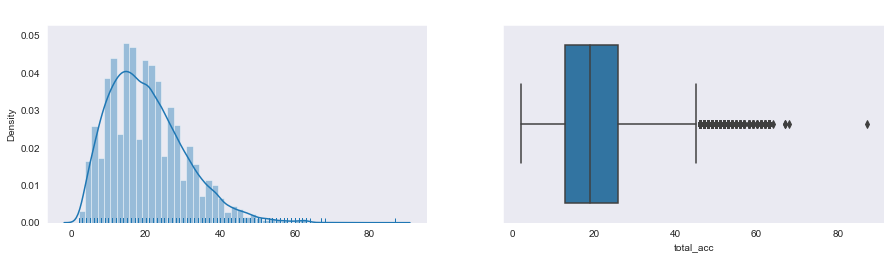

In [42]:
# total_acc

plt.figure(figsize=(15,8))
sns.set_style("dark")
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.distplot(data_clean['total_acc'],rug = True)
ax.set_title('total_acc - Distribution Chart',fontsize=16,color='w')
ax.set_xlabel('total_acc',fontsize=14,color='w')
# subplot 2
plt.subplot(2, 2, 2)
ax = sns.boxplot(data_clean['total_acc'])
ax.set_title('total_acc - Box Plot',fontsize=16,color='w')
ax.set_ylabel('total_acc',fontsize=14,color='w')
plt.show()

In [43]:
# There are many outliers in "total_acc", so removing them
per_95_annual_inc = data_clean['total_acc'].quantile(0.95)
data_clean = data_clean[data_clean.total_acc <= per_95_annual_inc]

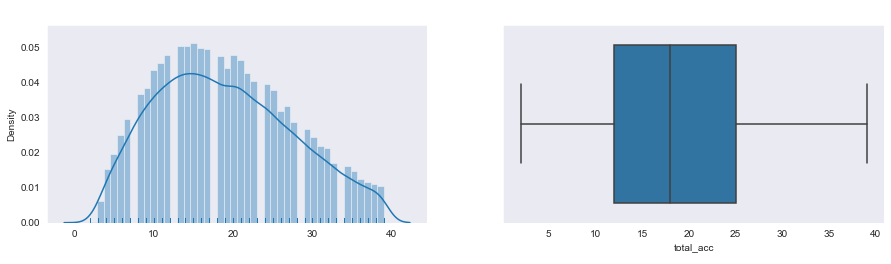

In [44]:
# total_acc - After removing outliers

plt.figure(figsize=(15,8))
sns.set_style("dark")
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.distplot(data_clean['total_acc'],rug = True)
ax.set_title('total_acc - Distribution Chart',fontsize=16,color='w')
ax.set_xlabel('total_acc',fontsize=14,color='w')
# subplot 2
plt.subplot(2, 2, 2)
ax = sns.boxplot(data_clean['total_acc'])
ax.set_title('total_acc - Box Plot',fontsize=16,color='w')
ax.set_ylabel('total_acc',fontsize=14,color='w')
plt.show()

#### "total_acc" has many outliers in the data. After removing them, the values range from 0 to 40

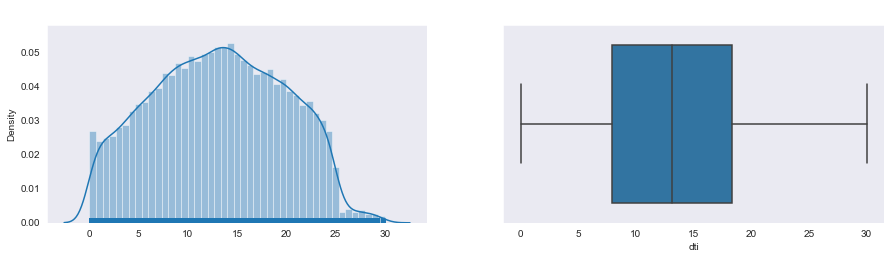

In [45]:
# dti

plt.figure(figsize=(15,8))
sns.set_style("dark")
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.distplot(data_clean['dti'],rug = True)
ax.set_title('dti - Distribution Chart',fontsize=16,color='w')
ax.set_xlabel('dti',fontsize=14,color='w')
# subplot 2
plt.subplot(2, 2, 2)
ax = sns.boxplot(data_clean['dti'])
ax.set_title('dti - Box Plot',fontsize=16,color='w')
ax.set_ylabel('dti',fontsize=14,color='w')
plt.show()

#### "dti" or popularly known as "Debt to Income Ratio" does not have any outliers and ranges from 0-30

<AxesSubplot:xlabel='loan_status', ylabel='count'>

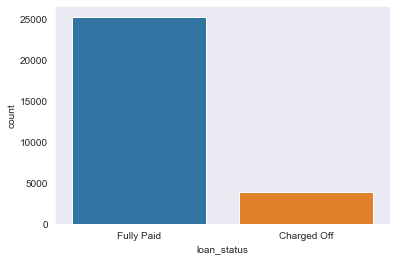

In [46]:
# Checking distribution of "loan_status"
sns.countplot(x = 'loan_status', data = data_clean)

#### It is observed that the majority class in the dependent column i.e "loan_status" is "Fully Paid"

### Bivariate Analysis

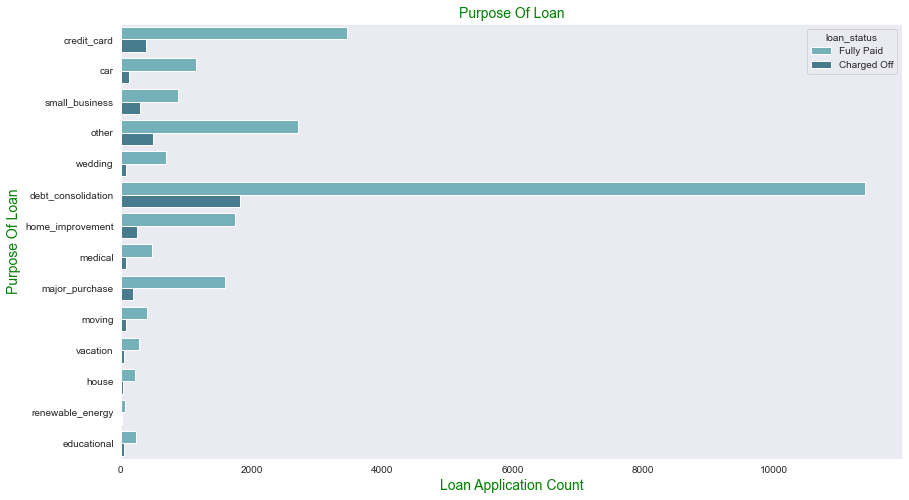

In [47]:
# Checking distribution of "purpose"- and the "loan_status"
plt.figure(figsize=(14,8))
sns.set_style("dark")
ax = sns.countplot(y="purpose",data=data_clean,hue='loan_status',palette='GnBu_d')
ax.set_title('Purpose Of Loan',fontsize=14,color='g')
ax.set_ylabel('Purpose Of Loan',fontsize=14,color = 'g')
ax.set_xlabel('Loan Application Count',fontsize=14,color = 'g')      
plt.show()

#### From the plot above, it can be inferred that the "Fully paid" loans are highest for "debt_consolidation" followed by "credit_card". The "Charged off" loans are also highest for "debt_consolidation", followed by "other"

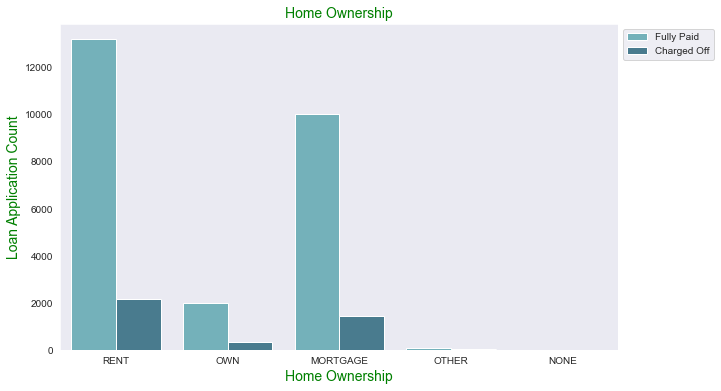

In [48]:
# Checking distribution of "home_ownership"- and the "loan_status"
plt.figure(figsize=(10,6))
ax = sns.countplot(x="home_ownership",data=data_clean,hue='loan_status',palette='GnBu_d')
ax.legend(bbox_to_anchor=(1, 1))
ax.set_title('Home Ownership',fontsize=14,color='g')
ax.set_xlabel('Home Ownership',fontsize=14,color = 'g')
ax.set_ylabel('Loan Application Count',fontsize=14,color = 'g')      
plt.show()

#### From the above plot, we can observe that the number of "Fully Paid" loans are high for "Rent" and "Mortgage". The "Charged off" loans are also high for these two categories

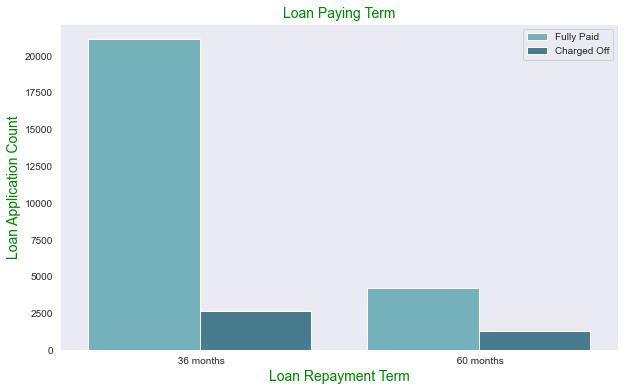

In [49]:
# Checking distribution of "term"- and the "loan_status"
plt.figure(figsize=(10,6))
ax = sns.countplot(x="term",data=data_clean,hue='loan_status',palette='GnBu_d')
ax.set_title('Loan Paying Term',fontsize=14,color='g')
ax.set_xlabel('Loan Repayment Term',fontsize=14,color = 'g')
ax.set_ylabel('Loan Application Count',fontsize=14,color = 'g')      
ax.legend(bbox_to_anchor=(1, 1))
plt.show()

#### It can be observed from the above plot that the "Charged off" loans are high for "36 months" tenure when compared to "60 months"

Text(0.5, 0, 'Employement Length')

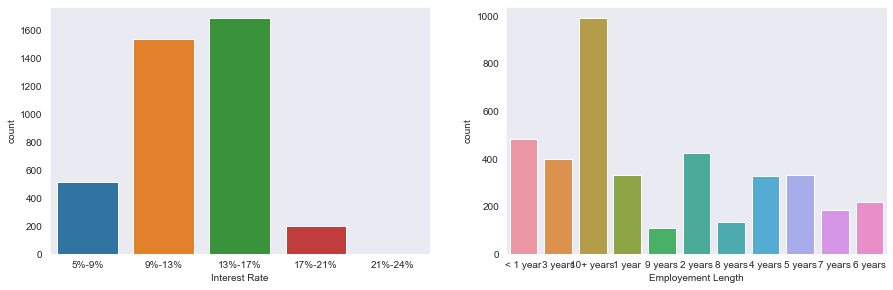

In [50]:
# int_rate_groups and emp_length
fig, ax = plt.subplots(figsize = (15,10))
plt.subplot(221)
sns.countplot(x='int_rate_groups', data=data_clean[data_clean.loan_status == 'Charged Off'])
plt.xlabel('Interest Rate')
plt.subplot(222)
sns.countplot(x='emp_length', data=data_clean[data_clean.loan_status == 'Charged Off'])
plt.xlabel('Employement Length')

#### From the above two plots, it can be inferred that the "Charged Off" loans are higher with interest rates in the range 13%-17%, followed by 9%-13%. For employment length, the number of "Charged off" loans are highest for applicants with 10+ years of experience

Text(0.5, 0, 'annual_inc_groups')

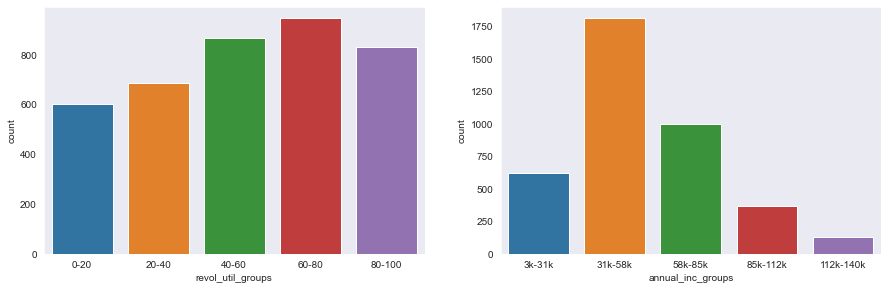

In [57]:
# revol_util_groups and annual_inc_groups
fig, ax = plt.subplots(figsize = (15,10))
plt.subplot(221)
sns.countplot(x='revol_util_groups', data=data_clean[data_clean.loan_status == 'Charged Off'])
plt.xlabel('revol_util_groups')
plt.subplot(222)
sns.countplot(x='annual_inc_groups', data=data_clean[data_clean.loan_status == 'Charged Off'])
plt.xlabel('annual_inc_groups')

#### It is observed that the most "Charged Off" loans are in the range 60-80, followed by 40-60. And the most "Charged Off" loans are in the annual income range of "31k-58k"

Text(0.5, 0, 'verification_status')

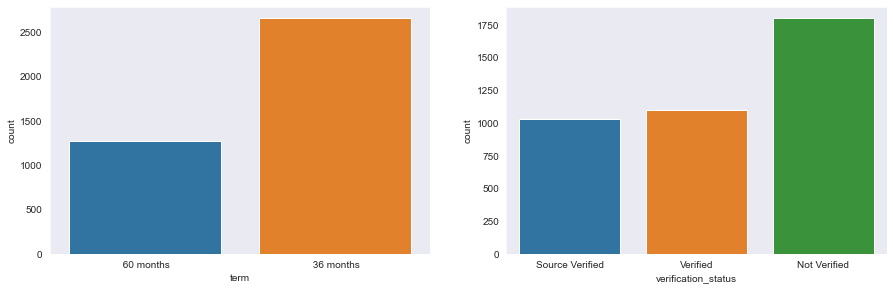

In [52]:
# term and verification_status
fig, ax = plt.subplots(figsize = (15,10))
plt.subplot(221)
sns.countplot(x='term', data=data_clean[data_clean.loan_status == 'Charged Off'])
plt.xlabel('term')
plt.subplot(222)
sns.countplot(x='verification_status', data=data_clean[data_clean.loan_status == 'Charged Off'])
plt.xlabel('verification_status')

#### It is observed that the "Charged Off" loans are highest for "36 months". For "verification_status", the "Charged off" loans are highest for "Not Verified" category

In [53]:
data_clean['installment_groups'] = pd.cut(data_clean['installment'], bins=10,precision =0,labels=['14-145','145-274','274-403','403-531','531-660','660-789','789-918','918-1047','1047-1176','1176-1305'])
data_clean['funded_amnt_inv_group'] = pd.cut(data_clean['funded_amnt_inv'], bins=7,labels=['0-5k','5k-10k','10k-15k','15k-20k','20k-25k','25k-30k','30k-35k'])
data_clean['loan_amnt_groups'] = pd.cut(data_clean['loan_amnt'], bins=7,precision =0,labels=['0-5k','5k-10k','10k-15k','15k-20k','20k-25k','25k-30k','30k-35k'])
data_clean['dti_groups'] = pd.cut(data_clean['dti'], bins=5,precision =0,labels=['0-6','6-12','12-18','18-24','24-30'])

Text(0.5, 0, 'funded_amnt_inv_group')

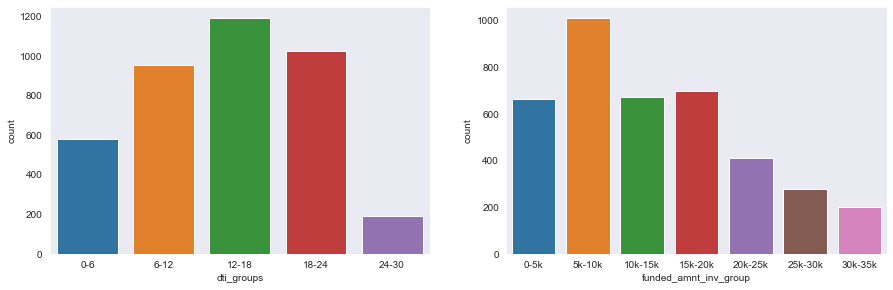

In [60]:
# dti_groups and funded_amnt_inv_group
fig, ax = plt.subplots(figsize = (15,10))
plt.subplot(221)
sns.countplot(x='dti_groups', data=data_clean[data_clean.loan_status == 'Charged Off'])
plt.xlabel('dti_groups')
plt.subplot(222)
sns.countplot(x='funded_amnt_inv_group', data=data_clean[data_clean.loan_status == 'Charged Off'])
plt.xlabel('funded_amnt_inv_group')

#### It is observed that the "Charged Off" loans are highest for a dti (Debt-to-Income Ratio) of 12-18, followed by 18-24. The highest number of "Charged Off" loans are in the funded amount range of 5k-10k

Text(0.5, 0, 'loan_amnt_groups')

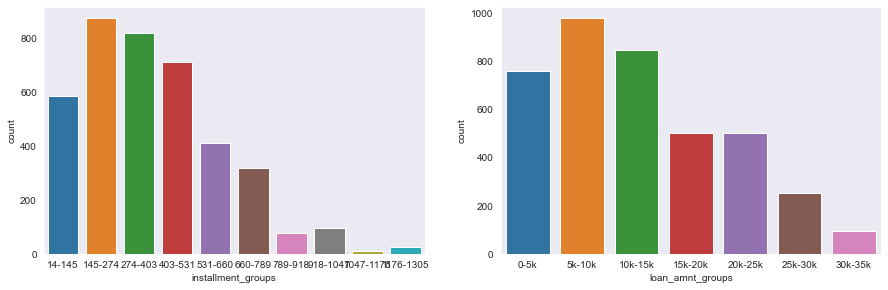

In [61]:
# dti_groups and funded_amnt_inv_group
fig, ax = plt.subplots(figsize = (15,10))
plt.subplot(221)
sns.countplot(x='installment_groups', data=data_clean[data_clean.loan_status == 'Charged Off'])
plt.xlabel('installment_groups')
plt.subplot(222)
sns.countplot(x='loan_amnt_groups', data=data_clean[data_clean.loan_status == 'Charged Off'])
plt.xlabel('loan_amnt_groups')

#### It is observed that the "Charged Off" loans are highest for installments 145-274. The highest number of "Charged Off" loans are in the loan amount range of 5k-10k

#### Correlation Matrix - Heatmap

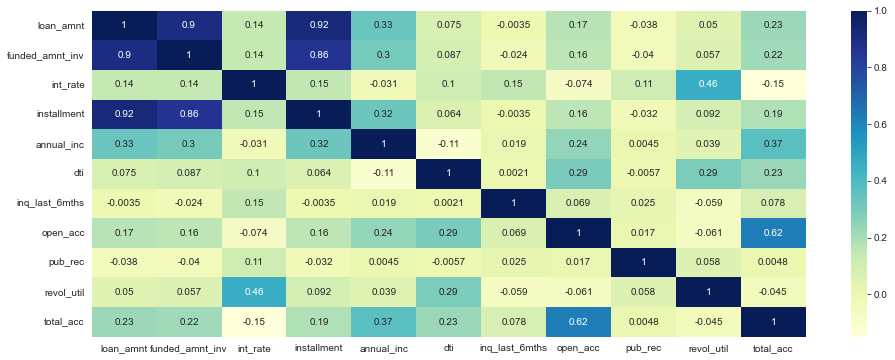

In [67]:
plt.figure(figsize=(16, 6))
dataplot = sns.heatmap(data_clean.corr(), cmap="YlGnBu", annot=True)

#### Following are list of features with high correlation (>0.6)
1. funded_amnt_int and loan_amnt
2. installment and loan_amnt
3. installemnt and funded_amnt_inv
4. open_acc and total_acc

### Multivariate Analysis

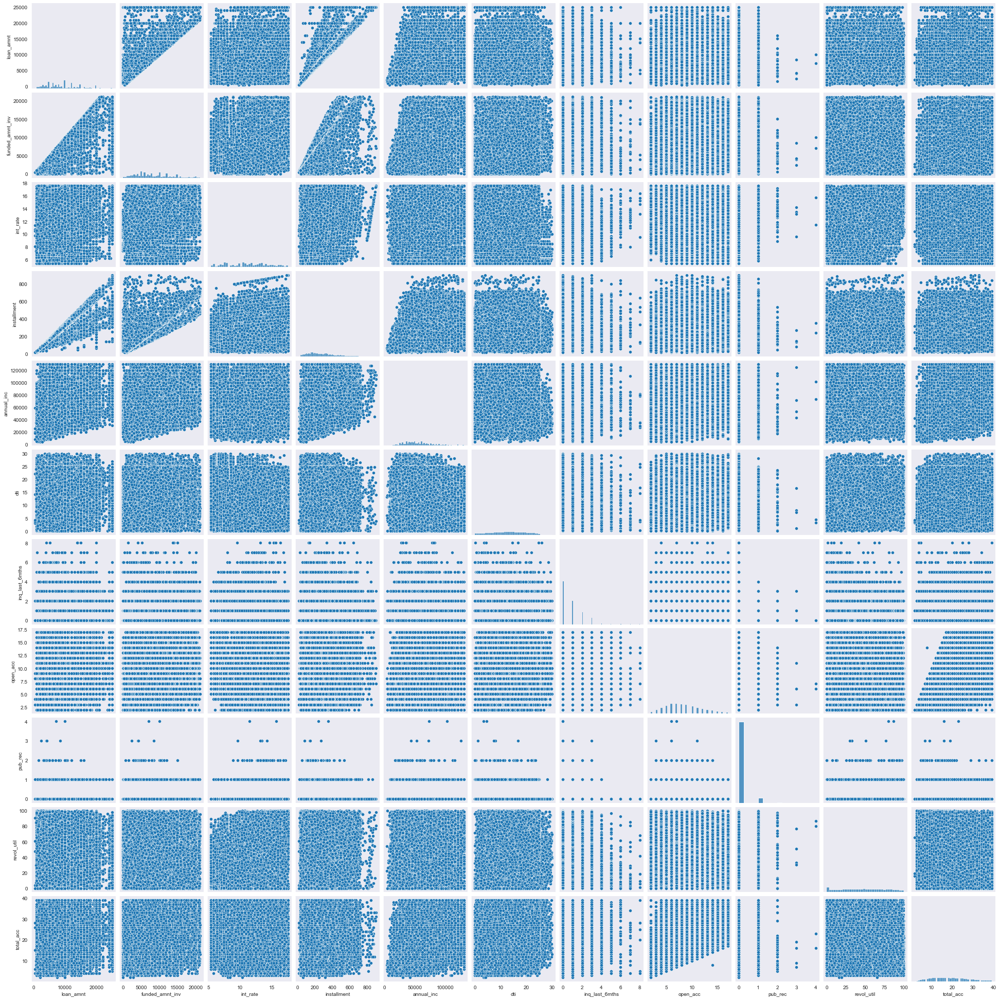

In [65]:
sns.pairplot(data_clean)

#### Pair plots are used for multivariate analysis, but for this data, not much of an insights can be observed

### 4. Recommendations

In [ ]:
# Listed below are the recommendations for Lending Club regarding which applicants to approve loans vs which not to approve

1. The probability of getting "Charged off" is lowest for 60 months tenure
2. For Purpose of loan, The probability of getting "Charged off" is highest for "Debt collection","credit card" and "other" categories. So it is not recommended to approve loans for these categories
3. For the type of Home ownership, though the number of "Charged off" loans are highest for both "rent" and "mortgage" categories, so are numbers high for "Fully paid" loans. So not much of inference can be found using this column.
4. For Interest rate, it is observed that 21%-24%, 17%-24% are having very less "Charged Off" loans. But these interest rates are high. After 17-24%, the number of "Charged off" loans are less for 5-9%. Hence it is recommended to approve loans with this interest rate category
5. For Employement Length, the least "Charged off" loans are for 8-9 years of experience. Hence it is recommended to approve loans for this category of applicants
6. For "revol_util" categories, the least "Charged off" loans are for 0-20 category. So it is recommended to approve loans for this category
7. The least number of "Charged Off" loans for "annual_income" ranges are 112k-140k followed by 85k-112k. But the number of applicants with these income ranges could be very less. The next category with least " Charged Off" loans was in the category 3k-31k. Hence it is recommended to approve loans for these categories
8. It is observed that the least "Charged off" loans are for "Status_verified" category. Hence it is recommended to verify the sources before approving the loan
9. The least "Charged Off" loans are for "dti" of 24-30 followed by 0-6. So it is recommended to approve loans for these categories
10. The "Charged Off" loans for funded amount by investor is least for 30-35k, followed by 25-30k and 20-25k. So, loans for these categories can be approved. But the number of loans with these categories many be less compared to others. Next best categories to approve loans are 0-5k and 10k-15k as the "Charged Off" loans are less
11. The "Charged Off" loans for installements of 1047-1176, and 1176-1305 are very less compared to other categories. Hence it is recommened to approve loans with these categories